# Import libraries 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('whitegrid')
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder

In [2]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
bank_marketing = fetch_ucirepo(id=222) 
  
# data (as pandas dataframes) 
X = bank_marketing.data.features 
y = bank_marketing.data.targets 
  
#concatinatig features with target
raw_df = pd.concat([X, y], axis = 1) 
df = raw_df.copy(deep = True)

In [3]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no


In [14]:
print('Shape of dataset :', df.shape)

Shape of dataset : (45211, 17)


In [4]:
df.columns.to_list()

['age',
 'job',
 'marital',
 'education',
 'default',
 'balance',
 'housing',
 'loan',
 'contact',
 'day_of_week',
 'month',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'poutcome',
 'y']

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          45211 non-null  int64 
 1   job          44923 non-null  object
 2   marital      45211 non-null  object
 3   education    43354 non-null  object
 4   default      45211 non-null  object
 5   balance      45211 non-null  int64 
 6   housing      45211 non-null  object
 7   loan         45211 non-null  object
 8   contact      32191 non-null  object
 9   day_of_week  45211 non-null  int64 
 10  month        45211 non-null  object
 11  duration     45211 non-null  int64 
 12  campaign     45211 non-null  int64 
 13  pdays        45211 non-null  int64 
 14  previous     45211 non-null  int64 
 15  poutcome     8252 non-null   object
 16  y            45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [26]:
df.describe()

,age,balance,day_of_week,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


The dataset has the following attributes:

>1.age (numeric)
>
>2.job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student","blue-
>
>3.collar","self-employed","retired","technician","services")
>
>4.marital : marital status (categorical: "married","divorced","single"; note: "divorced" meansdivorced or widowed)
>
>5education (categorical: "unknown","secondary","primary","tertiary")
>
>6.default: has credit in default? (binary: "yes","no")
>
>7.balance: average yearly balance, in euros (numeric)
>
>8.housing: has housing loan? (binary: "yes","no")
>
>9.loan: has personal loan? (binary: "yes","no")
>
>10.contact: contact communication type (categorical: "unknown","telephone","cellular")
>
>11.day: last contact day of the month (numeric)
>
>12.month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
>
>13.duration: last contact duration, in seconds (numeric)
>
>14.campaign: number of contacts performed during this campaign and for this client (numeric,includes last contact)
>
>15.pdays: number of days that passed by after the client was last contacted from a previouscampaign (numeric, -1 means client was not previously contacted)
>
>16.previous: number of contacts performed before this campaign and for this client (numeric)
>
>17.poutcome: outcome of the previous marketing campaign (categorical:"unknown","other","failure","success")
>
>#### Target Variable:
>
>18.y : has the client subscribed to a term deposit?(binary: "yes","no")

# Handeling Missing values

Let's check that this dataset has missing value or not

In [3]:
df.isna().sum().sum()

52124

This dataset has null value
>columns :
>
>'job'(obj), 'education'(obj) , 'contact'(obj) and 'poutcome' (obj )have missing value.


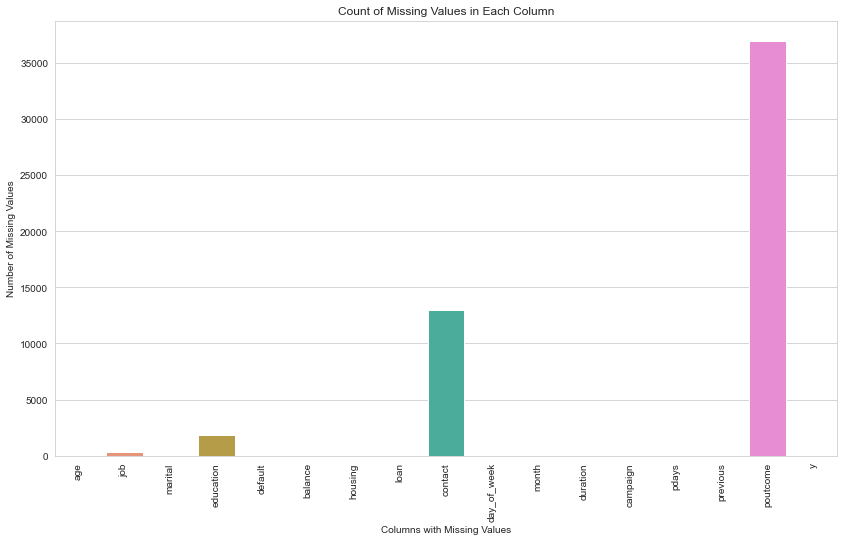

In [27]:
missing_values = df.isna().sum()
plt.figure(figsize=(14, 8))
sns.barplot(x=missing_values.index, y=missing_values.values)
plt.xlabel('Columns with Missing Values')
plt.ylabel('Number of Missing Values')
plt.title('Count of Missing Values in Each Column')
plt.xticks(rotation=90)
plt.show()

In [28]:
# Columns with missing values
na_cols=df.columns[df.isna().any()].tolist()

# Missing values summary
mv=pd.DataFrame(df[na_cols].isna().sum().sort_values(ascending=False), columns=['Number_missing'])
mv['Percentage_missing']=np.round(100*mv['Number_missing']/len(df),2)
mv

,Number_missing,Percentage_missing
poutcome,36959,81.75
contact,13020,28.80
education,1857,4.11
job,288,0.64


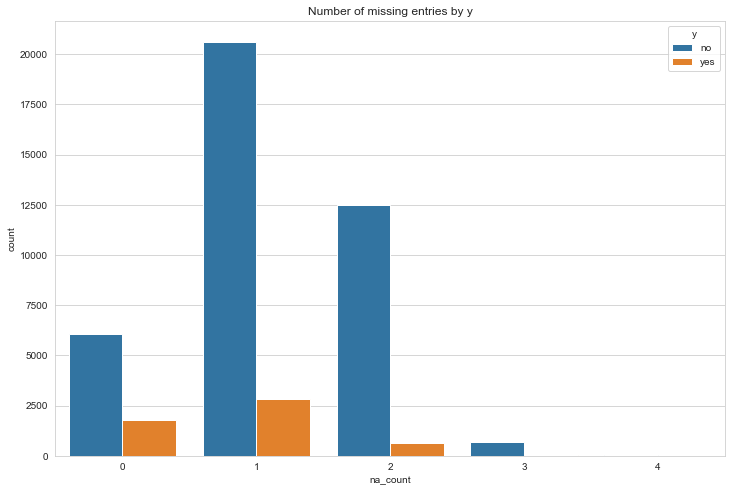

In [30]:
df['na_count'] = df.isna().sum(axis = 1)
plt.figure(figsize = (12, 8))
sns.countplot(data = df, x = 'na_count', hue = 'y')
plt.title('Number of missing entries by y')
df.drop('na_count', axis = 1, inplace = True)

Most of the missing values belong to y=no

Since column poutcome has more than 80% missing value, we delete it.

In [3]:
df.drop('poutcome', axis=1, inplace= True)

Filling categorical columns by Simpleimputer and most frequent strategy:

In [4]:
def impute(data, columns, strategy = 'most_frequent'):
    """
    fill missing value in each column with specific strategy
    
        input :
            data : orginal dataset.
            columns : columns that have missing value. 
            strategy :it is different depending on the data type of each column.

        output: dataset with out missing value
    """
    imputer = SimpleImputer(strategy = strategy)
    data[columns] = imputer.fit_transform(data[columns])
    return data

In [5]:
impute_df = df.copy(deep = True)
categorcal_columns = ['job','contact','education']

impute(impute_df, categorcal_columns, strategy = 'most_frequent')

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,no,2143,yes,no,cellular,5,may,261,1,-1,0,no
1,44,technician,single,secondary,no,29,yes,no,cellular,5,may,151,1,-1,0,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,cellular,5,may,76,1,-1,0,no
3,47,blue-collar,married,secondary,no,1506,yes,no,cellular,5,may,92,1,-1,0,no
4,33,blue-collar,single,secondary,no,1,no,no,cellular,5,may,198,1,-1,0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,no


In [6]:
impute_df.isna().sum().sum()

0

We don't have any missing value.

# EDA and Visualization

### Age
Let's explore in age:

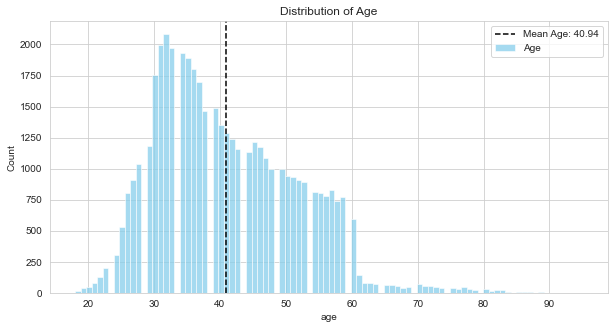

In [133]:
plt.figure(figsize=(10,5))
sns.histplot(x=impute_df['age'],color='skyblue',label='Age')
plt.axvline(x=impute_df['age'].mean(),color='k',linestyle ="--",label='Mean Age: {}'.format(round(impute_df['age'].mean(),2)))
plt.legend()

plt.title('Distribution of Age')
plt.show()

This chart shows the data distribution better.
>The average age is 40.

### job

In [88]:
fig = px.pie(impute_df, values=np.ones(45211), names='job', title='job',color_discrete_sequence=px.colors.sequential.Brwnyl)
fig.show()

This chart shows the percentage of presence of each job better.
>Management and Blue-collar Job type Clients are maximum in the bank
>
>There are very less number of student customers in the bank

### Marital, Education, Contact

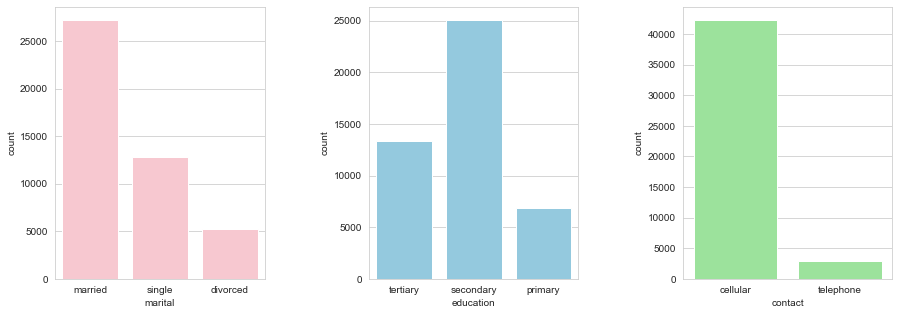

In [113]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.countplot(x="marital", data=impute_df, color='pink')
plt.subplot(1,3,2)
sns.countplot(x="education", data=impute_df,color='skyblue')
plt.subplot(1,3,3)
sns.countplot(x="contact", data=impute_df,color='lightgreen')
plt.subplots_adjust(wspace=0.5)

These charts show the number of presence of each class in categorical columns better.
>Most of the clients in the bank are Married.
>
>Most of the customers in the bank are related to Secondary.
>
>Most of the customers in the bank are contacted through Cellular


### month

<AxesSubplot:xlabel='month', ylabel='count'>

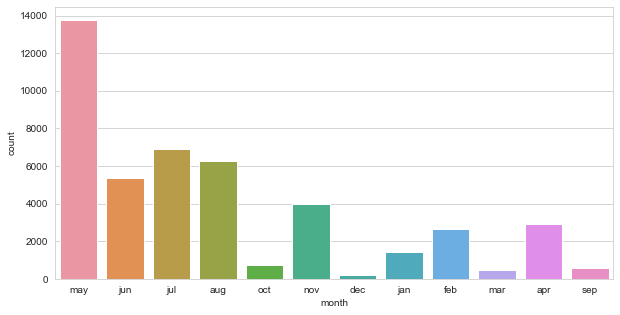

In [118]:
plt.figure(figsize=(10,5))
sns.countplot(data=impute_df, x='month')

This chart shows the number of presence of each month better.
>Most of the clients in the bank are contacted in the months of May ,Jul and in Aug last year.
>
>very few of the clients are contacted in the months of Dec.

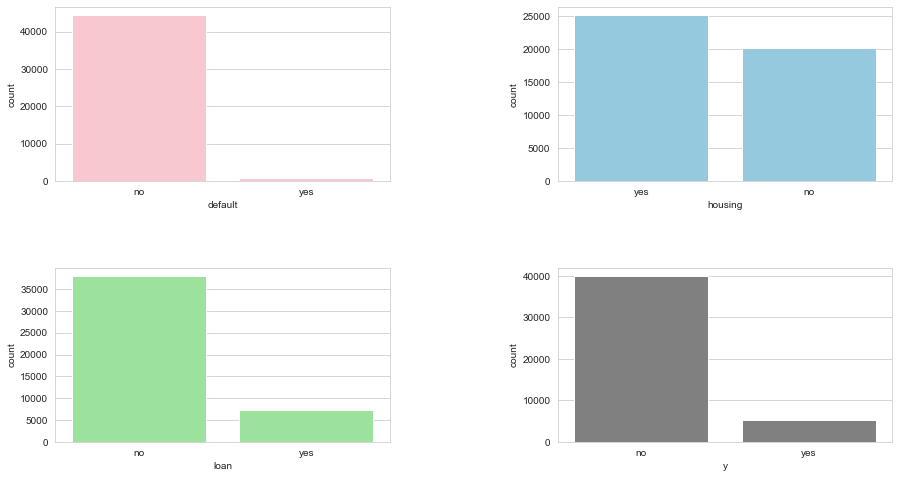

In [126]:
plt.figure(figsize=(15,8))

plt.subplot(2,2,1)
sns.countplot(x="default", data=impute_df, color='pink')
plt.subplot(2,2,2)
sns.countplot(x="housing", data=impute_df,color='skyblue')
plt.subplot(2,2,3)
sns.countplot(x="loan", data=impute_df,color='lightgreen')
plt.subplot(2,2,4)
sns.countplot(x="y", data=impute_df,color='gray')

plt.subplots_adjust(wspace=0.5)
plt.subplots_adjust(hspace=0.5)

These charts show the number of presence of each class in categorical columns better.
>Most of the customers in the bank doesn't have Credit in Default.
>
>Most of the customers in the bank doesn't have Housing Loan.
>
>Most of the customers in the bank doesn't have Personal Loan.
>
>Most of the customers in the bank doesn't have Deposit.

### Balance

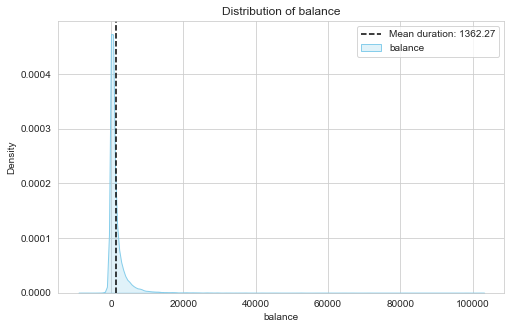

In [134]:
plt.figure(figsize=(8,5))
sns.kdeplot(x=impute_df['balance'],color='skyblue',shade=True,label='balance')
plt.axvline(x=impute_df['balance'].mean(),color='k',linestyle ="--",label='Mean duration: {}'.format(round(impute_df['balance'].mean(),2)))
plt.legend()
plt.title('Distribution of balance')
plt.show()

This chart shows the balance distribution better.
>The average of customer balance in bank is 1362.

### Duration

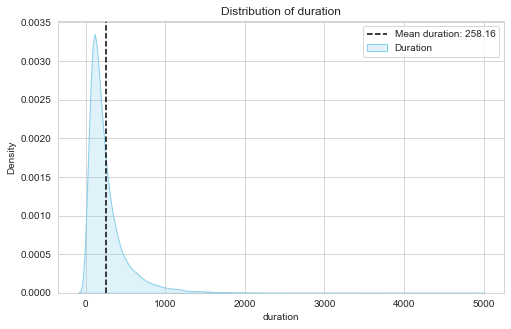

In [135]:
plt.figure(figsize=(8,5))
sns.kdeplot(x=impute_df['duration'],color='skyblue',shade=True,label='Duration')
plt.axvline(x=impute_df['duration'].mean(),color='k',linestyle ="--",label='Mean duration: {}'.format(round(impute_df['duration'].mean(),2)))
plt.legend()
plt.title('Distribution of duration')
plt.show()

This chart shows the duration distribution better.
>On average, the last call duration was 258 seconds.

### pdays

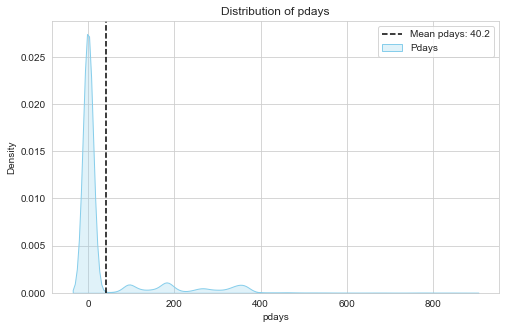

In [136]:
plt.figure(figsize=(8,5))
sns.kdeplot(x=impute_df['pdays'],color='skyblue',shade=True,label='Pdays')
plt.axvline(x=impute_df['pdays'].mean(),color='k',linestyle ="--",label='Mean pdays: {}'.format(round(impute_df['pdays'].mean(),2)))
plt.legend()
plt.title('Distribution of pdays')
plt.show()

This chart shows the pdays distribution better.
>On average, 40 days have passed since the last customer contact from a previous campaign.

### previous

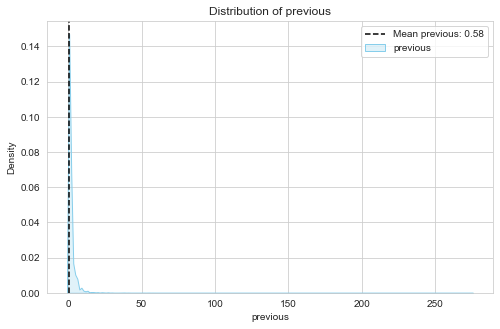

In [238]:
plt.figure(figsize=(8,5))
sns.kdeplot(x=impute_df['previous'],color='skyblue',shade=True,label='previous')
plt.axvline(x=impute_df['previous'].mean(),color='k',linestyle ="--",label='Mean previous: {}'.format(round(impute_df['previous'].mean(),2)))
plt.legend()
plt.title('Distribution of previous')
plt.show()

### campaign

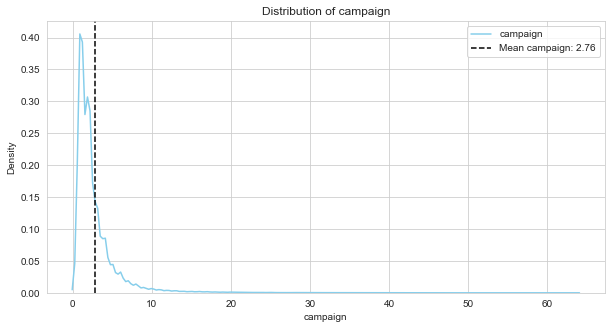

In [237]:
plt.figure(figsize=(10,5))
sns.kdeplot(x=impute_df['campaign'],color='skyblue',label='campaign')
plt.axvline(x=impute_df['campaign'].mean(),color='k',linestyle ="--",label='Mean campaign: {}'.format(round(impute_df['campaign'].mean(),2)))
plt.legend()

plt.title('Distribution of campaign')
plt.show()

Text(0.5, 1.0, 'Average of age based job')

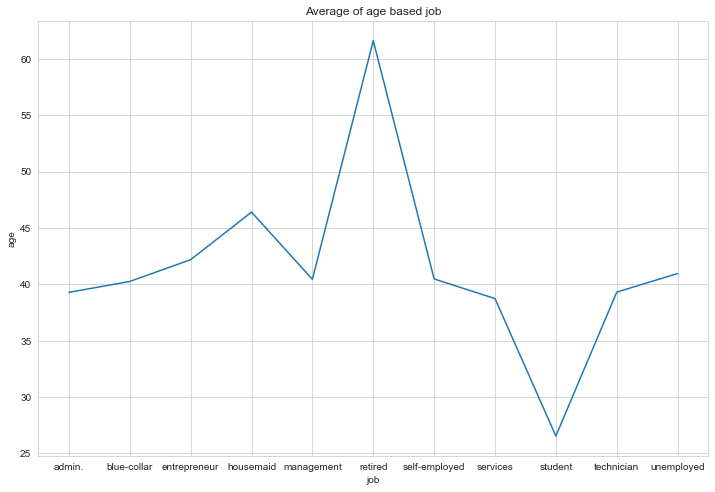

In [163]:
mean_age_job = impute_df.groupby('job')['age'].mean().reset_index()

plt.figure(figsize=(12, 8))
sns.lineplot(data=mean_age_job, x='job', y='age')
plt.title('Average of age based job')

This chart shows the average age in each job.
>The average age of retired is 65 
>
>The average age of student is 65 

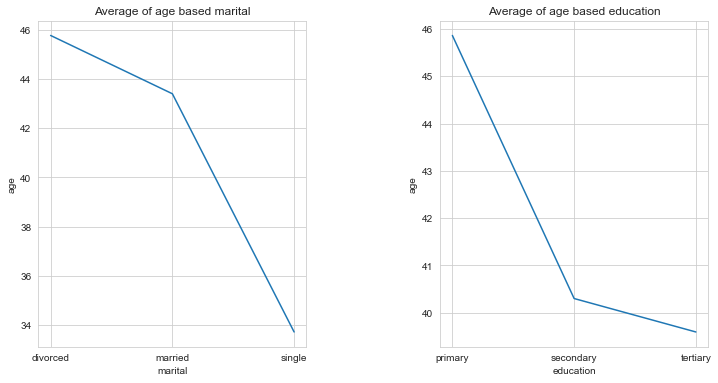

In [173]:
mean_age_marital = impute_df.groupby('marital')['age'].mean().reset_index()
mean_age_education = impute_df.groupby('education')['age'].mean().reset_index()

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
sns.lineplot(data=mean_age_marital, x='marital', y='age')
plt.title('Average of age based marital')
plt.subplot(1,2,2)
sns.lineplot(data=mean_age_education, x='education', y='age')
plt.title('Average of age based education')


plt.subplots_adjust(wspace=0.5)
plt.subplots_adjust(hspace=0.5)

These chart show the average age in each marital and education.
>##### marital
>The average age of divorce is 46. 
>
>The average age of married is 43.
>
>The average age of single is 33. 
>
>##### education
>The average age of primary is 46.
>
>The average age of secondary is 40.
>
>The average age of teriary is 39.

In [165]:
#fig=px.box(impute_df,x='marital',y='age',color='marital',title='Distribution of age based on Marital Status',color_discrete_sequence=['HotPink','LightSeaGreen','SlateBlue'])
#fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Marital Status")
#fig.show()

In [192]:
mean_age_housing = impute_df.groupby('housing')['age'].mean().reset_index()
mean_age_loan = impute_df.groupby('loan')['age'].mean().reset_index()
mean_age_deposit = impute_df.groupby('y')['age'].mean().reset_index()

print('housing')
print('------')
print(mean_age_housing)
print('\n')
print('loan')
print('------')
print(mean_age_loan)
print('\n')
print('deposit')
print('------')
print(mean_age_deposit)

housing
------
  housing        age
0      no  43.139883
1     yes  39.175288


loan
------
  loan        age
0   no  41.008823
1  yes  40.555632


deposit
------
     y        age
0   no  40.838986
1  yes  41.670070


The average age of :
>the clients who subscribed for the housing loan is 39.
>
>the clients who are not subscribed for the housing loan is 43.
>
>the clients who subscribed and not subscribed for the personal loan is almost same.
>
>the clients who subscribed and not subscribed for the term deposit is almost same.

In [218]:
fig = go.Figure()
fig.add_trace(go.Box(x=impute_df['y'],y=impute_df['duration'],boxmean=True ))
fig.update_layout(
    title="<b>Distribution of duration based on y",
    xaxis_title="y",
    yaxis_title="duration"
)
fig.show()

The avarage duration of the clients who subscribed for the term deposit is 537.

The avarage duration of the clients who are not subscribed for the term deposit is 221.

It is clear, that the duration is highly affecting the target variable.

In [219]:
fig = go.Figure()
fig.add_trace(go.Box(x=impute_df['y'],y=impute_df['balance'],boxmean=True ))
fig.update_layout(
    title="<b>Distribution of balancr based on y",
    xaxis_title="y",
    yaxis_title="balance"
)
fig.show()

The avarage balance the clients who subscribed and not subscribed for the term deposit is almost same.

In [227]:
mean_pdays = impute_df.groupby('y')['pdays'].mean().reset_index()

mean_pdays

,y,pdays
0,no,36.421372
1,yes,68.702968


Those who have registered for deposit an average of 68 days since their last call

In [226]:
mean_previous = impute_df.groupby('y')['previous'].mean().reset_index()

mean_previous

,y,previous
0,no,0.502154
1,yes,1.170354


In [231]:
mean_campaign = impute_df.groupby('y')['campaign'].mean().reset_index()

mean_campaign

,y,campaign
0,no,2.846350
1,yes,2.141047


The avarage number of campaign of  the clients who subscribed and not subscribed for the term deposit is almost same.

# Encoding 

## 1.Mapping

Features that have (Yes and NO) values:

In [7]:
en_df = impute_df.copy(deep=True)

# Create a mapping dictionary
mapping = {'yes':1, 'no':0}

# Apply the mapping to multiple columns using applymap()
en_df[['default','housing','loan','y']] = en_df[['default','housing','loan','y']].applymap(mapping.get)

In [8]:
en_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,0,2143,1,0,cellular,5,may,261,1,-1,0,0
1,44,technician,single,secondary,0,29,1,0,cellular,5,may,151,1,-1,0,0
2,33,entrepreneur,married,secondary,0,2,1,1,cellular,5,may,76,1,-1,0,0
3,47,blue-collar,married,secondary,0,1506,1,0,cellular,5,may,92,1,-1,0,0
4,33,blue-collar,single,secondary,0,1,0,0,cellular,5,may,198,1,-1,0,0


<AxesSubplot:xlabel='y', ylabel='count'>

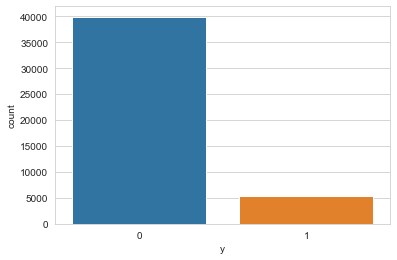

In [9]:
sns.countplot(data=en_df, x ='y')

Dataset is imbalance and most of the customers have not registered the term deposit.

<AxesSubplot:xlabel='job', ylabel='count'>

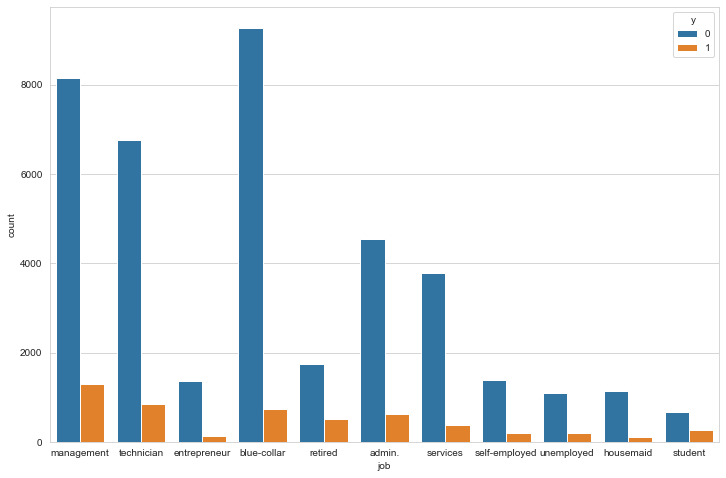

In [22]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='job', hue='y')

In [42]:
for value in en_df['job'].unique():
    x, y = en_df[en_df['job']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

management
0 : 8157
1 : 1301
How many percent did not accept: 0.86


technician
0 : 6757
1 : 840
How many percent did not accept: 0.89


entrepreneur
0 : 1364
1 : 123
How many percent did not accept: 0.92


blue-collar
0 : 9278
1 : 742
How many percent did not accept: 0.93


retired
0 : 1748
1 : 516
How many percent did not accept: 0.77


admin.
0 : 4540
1 : 631
How many percent did not accept: 0.88


services
0 : 3785
1 : 369
How many percent did not accept: 0.91


self-employed
0 : 1392
1 : 187
How many percent did not accept: 0.88


unemployed
0 : 1101
1 : 202
How many percent did not accept: 0.84


housemaid
0 : 1131
1 : 109
How many percent did not accept: 0.91


student
0 : 669
1 : 269
How many percent did not accept: 0.71




Among the jobs, jobs blue-collar has not registered more term deposit than other.

<AxesSubplot:xlabel='marital', ylabel='count'>

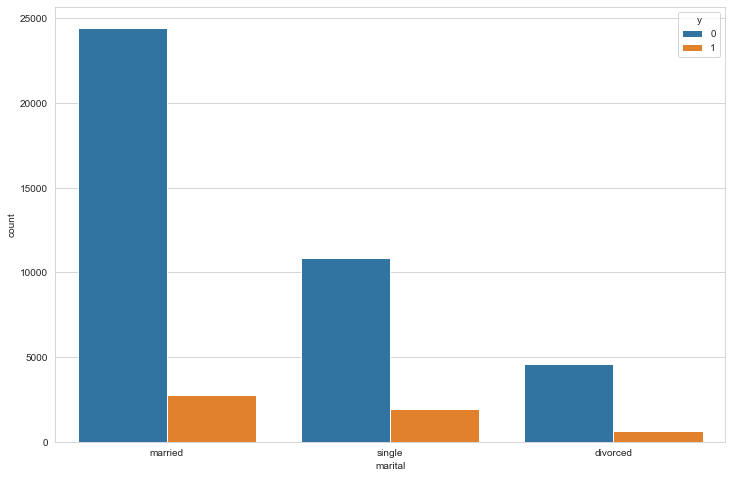

In [43]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='marital', hue='y')

In [48]:
for value in en_df['marital'].unique():
    x, y = en_df[en_df['marital']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

married
0 : 24459
1 : 2755
How many percent did not accept: 0.9


single
0 : 10878
1 : 1912
How many percent did not accept: 0.85


divorced
0 : 4585
1 : 622
How many percent did not accept: 0.88




Among the marital, married  has not registered more term deposit than other.

<AxesSubplot:xlabel='education', ylabel='count'>

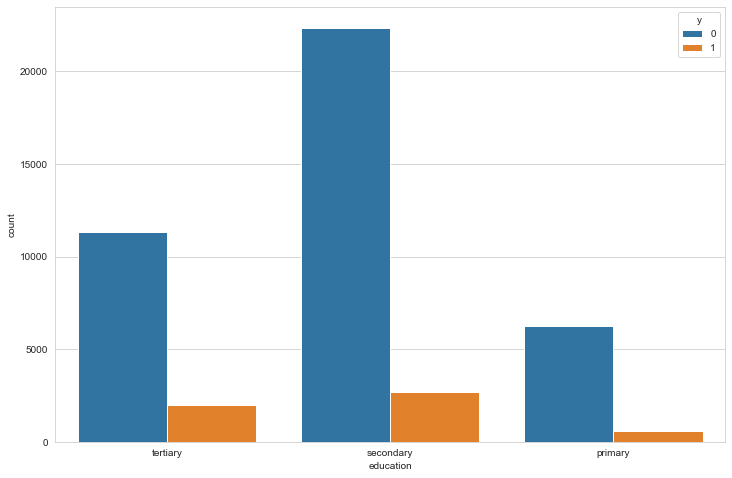

In [44]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='education', hue='y')

In [49]:
for value in en_df['education'].unique():
    x, y = en_df[en_df['education']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

tertiary
0 : 11305
1 : 1996
How many percent did not accept: 0.85


secondary
0 : 22357
1 : 2702
How many percent did not accept: 0.89


primary
0 : 6260
1 : 591
How many percent did not accept: 0.91




Among the education, primary has not registered more term deposit than other.

<AxesSubplot:xlabel='contact', ylabel='count'>

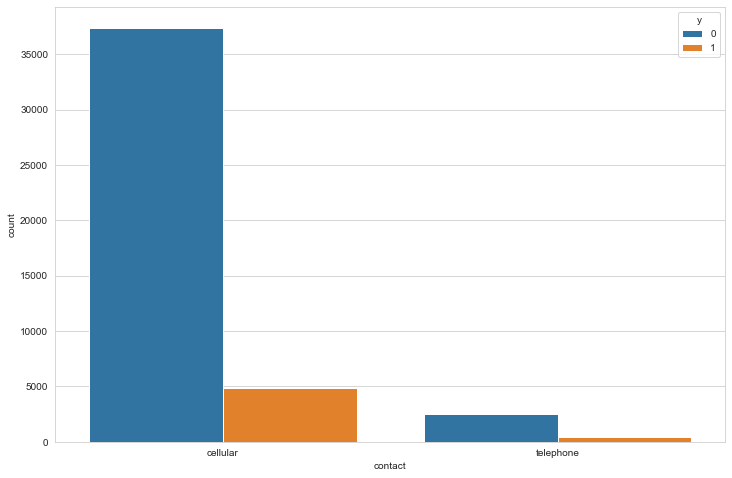

In [45]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='contact', hue='y')

In [50]:
for value in en_df['contact'].unique():
    x, y = en_df[en_df['contact']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

cellular
0 : 37406
1 : 4899
How many percent did not accept: 0.88


telephone
0 : 2516
1 : 390
How many percent did not accept: 0.87




Among the cantact, cellular has not registered more term deposit than telephone.But the difference is not much.

<AxesSubplot:xlabel='month', ylabel='count'>

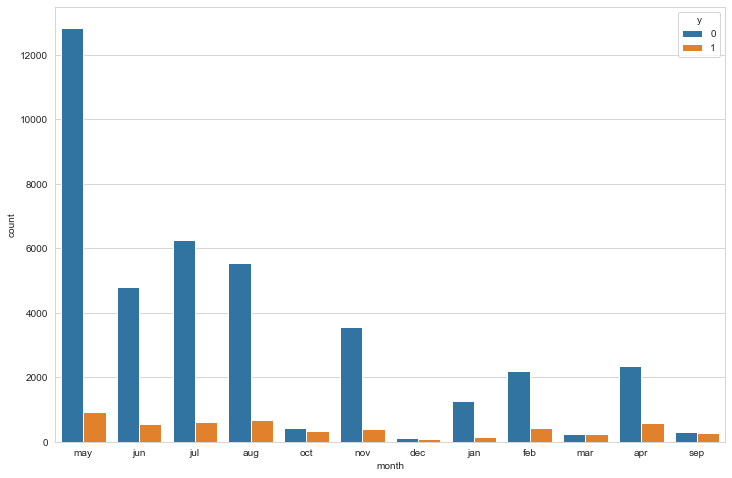

In [47]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='month', hue='y')

In [51]:
for value in en_df['month'].unique():
    x, y = en_df[en_df['month']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

may
0 : 12841
1 : 925
How many percent did not accept: 0.93


jun
0 : 4795
1 : 546
How many percent did not accept: 0.9


jul
0 : 6268
1 : 627
How many percent did not accept: 0.91


aug
0 : 5559
1 : 688
How many percent did not accept: 0.89


oct
0 : 415
1 : 323
How many percent did not accept: 0.56


nov
0 : 3567
1 : 403
How many percent did not accept: 0.9


dec
0 : 114
1 : 100
How many percent did not accept: 0.53


jan
0 : 1261
1 : 142
How many percent did not accept: 0.9


feb
0 : 2208
1 : 441
How many percent did not accept: 0.83


mar
0 : 248
1 : 229
How many percent did not accept: 0.52


apr
0 : 2355
1 : 577
How many percent did not accept: 0.8


sep
0 : 310
1 : 269
How many percent did not accept: 0.54




More people did not register in May and more people registered in March.

<AxesSubplot:xlabel='default', ylabel='count'>

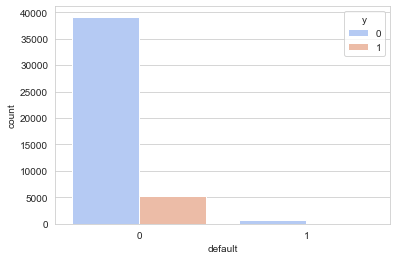

In [25]:
sns.countplot(data=en_df, x='default', hue='y',palette='coolwarm')

In [22]:
for value in en_df['default'].unique():
    x, y = en_df[en_df['default']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

0
0 : 39159
1 : 5237
How many percent did not accept: 0.88


1
0 : 763
1 : 52
How many percent did not accept: 0.94




Those who had a credit were more likely to not register for a deposit than those who did not.

<AxesSubplot:xlabel='housing', ylabel='count'>

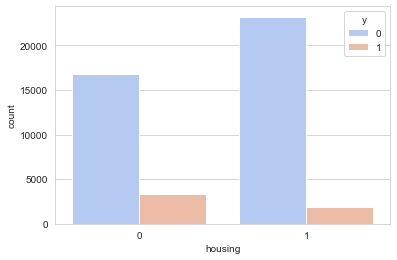

In [26]:
sns.countplot(data=en_df, x='housing', hue='y',palette='coolwarm')

In [19]:
for value in en_df['housing'].unique():
    x, y = en_df[en_df['housing']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

1
0 : 23195
1 : 1935
How many percent did not accept: 0.92


0
0 : 16727
1 : 3354
How many percent did not accept: 0.83




Those who had a home loan were more likely to not register for a deposit than those who did not.

<AxesSubplot:xlabel='loan', ylabel='count'>

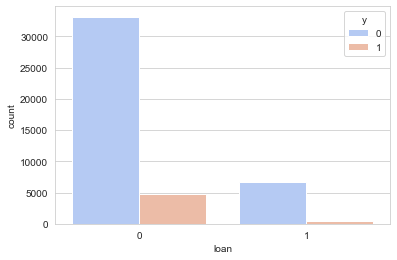

In [24]:
sns.countplot(data=en_df, x='loan', hue='y', palette='coolwarm')

In [20]:
for value in en_df['loan'].unique():
    x, y = en_df[en_df['loan']==value]['y'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print('How many percent did not accept:', round(x/(x+y),2))
    print('\n')

0
0 : 33162
1 : 4805
How many percent did not accept: 0.87


1
0 : 6760
1 : 484
How many percent did not accept: 0.93




Those who had a personal loan were more likely to not register for a deposit than those who did not.

In [7]:
en_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,0,2143,1,0,cellular,5,may,261,1,-1,0,0
1,44,technician,single,secondary,0,29,1,0,cellular,5,may,151,1,-1,0,0
2,33,entrepreneur,married,secondary,0,2,1,1,cellular,5,may,76,1,-1,0,0
3,47,blue-collar,married,secondary,0,1506,1,0,cellular,5,may,92,1,-1,0,0
4,33,blue-collar,single,secondary,0,1,0,0,cellular,5,may,198,1,-1,0,0


Text(0.5, 0, 'age')

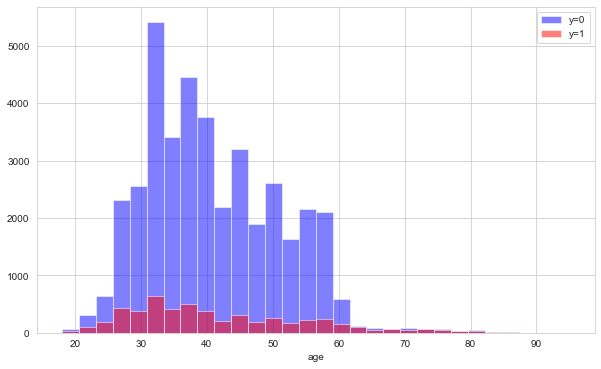

In [9]:
plt.figure(figsize=(10,6))
en_df[en_df['y']==0]['age'].hist(alpha=0.5,color='blue',bins=30,label='y=0')
en_df[en_df['y']==1]['age'].hist(alpha=0.5,color='red',bins=30,label='y=1')
plt.legend()
plt.xlabel('age')

Among all age groups, most people have not registered for deposits.

Text(0.5, 0, 'duration')

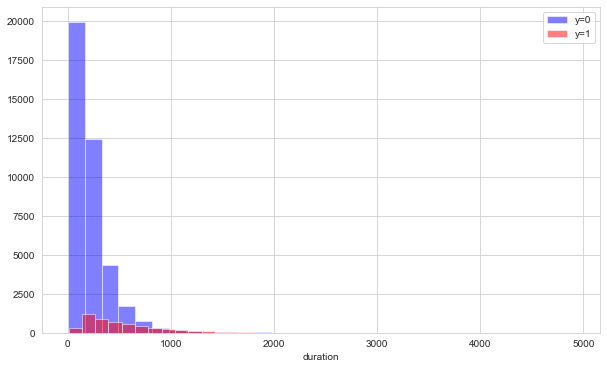

In [10]:
plt.figure(figsize=(10,6))
en_df[en_df['y']==0]['duration'].hist(alpha=0.5,color='blue',bins=30,label='y=0')
en_df[en_df['y']==1]['duration'].hist(alpha=0.5,color='red',bins=30,label='y=1')
plt.legend()
plt.xlabel('duration')

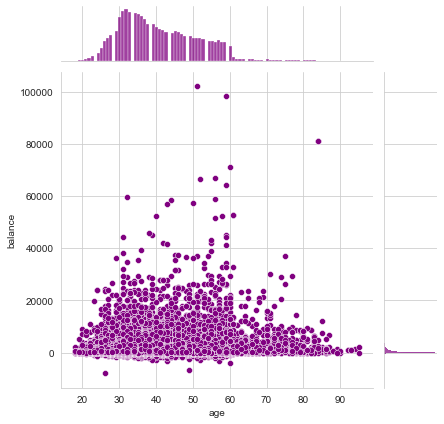

In [12]:
sns.jointplot(x='age',y='balance',data=en_df,color='purple')

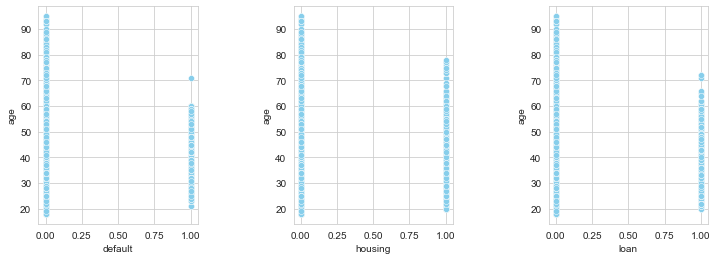

In [49]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
sns.scatterplot(x='default',y='age',data=en_df,color='skyblue')

plt.subplot(1,3,2)
sns.scatterplot(x='housing',y='age',data=en_df,color='skyblue')

plt.subplot(1,3,3)
sns.scatterplot(x='loan',y='age',data=en_df,color='skyblue')

plt.subplots_adjust(wspace=0.6)

It can be said that almost people over the age of 75 do not have a home loan or personal loan or credit.

<AxesSubplot:xlabel='job', ylabel='count'>

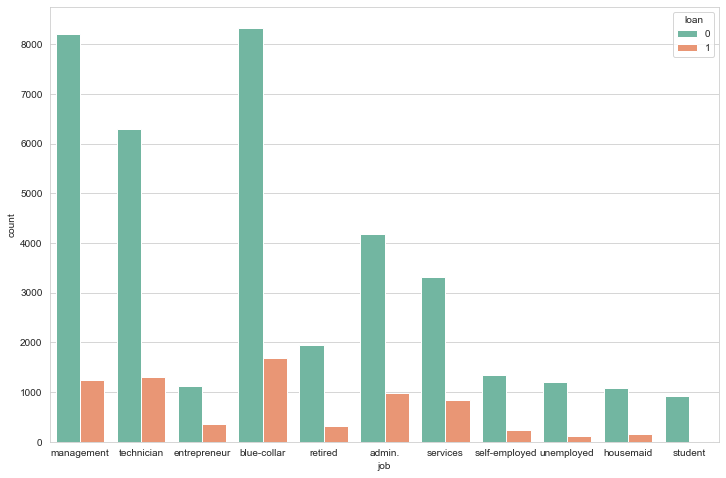

In [52]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='job', hue='loan',palette='Set2')

In [26]:
for value in en_df['job'].unique():
    x, y = en_df[en_df['job']==value]['loan'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print("How many percent have personal loan:", round(y/(x+y),2))
    print('\n')

management
0 : 8205
1 : 1253
How many percent have personal loan: 0.13


technician
0 : 6288
1 : 1309
How many percent have personal loan: 0.17


entrepreneur
0 : 1131
1 : 356
How many percent have personal loan: 0.24


blue-collar
0 : 8332
1 : 1688
How many percent have personal loan: 0.17


retired
0 : 1955
1 : 309
How many percent have personal loan: 0.14


admin.
0 : 4180
1 : 991
How many percent have personal loan: 0.19


services
0 : 3318
1 : 836
How many percent have personal loan: 0.2


self-employed
0 : 1350
1 : 229
How many percent have personal loan: 0.15


unemployed
0 : 1194
1 : 109
How many percent have personal loan: 0.08


housemaid
0 : 1088
1 : 152
How many percent have personal loan: 0.12


student
0 : 926
1 : 12
How many percent have personal loan: 0.01




It is natural that students and unemployed people have not taken loans because they have no income, and also entrepreneurs have taken more loans.

<AxesSubplot:xlabel='marital', ylabel='count'>

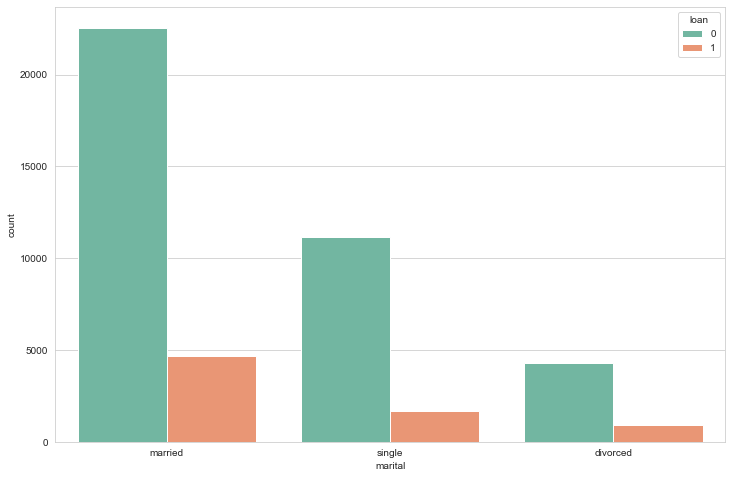

In [53]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='marital', hue='loan',palette='Set2')

In [25]:
for value in en_df['marital'].unique():
    x, y = en_df[en_df['marital']==value]['loan'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print("How many percent have personal loan:", round(y/(x+y),2))
    print('\n')

married
0 : 22554
1 : 4660
How many percent have personal loan: 0.17


single
0 : 11127
1 : 1663
How many percent have personal loan: 0.13


divorced
0 : 4286
1 : 921
How many percent have personal loan: 0.18




Those who are divorced have taken personal loans more than others. Those who are single have taken less personal loans than others, but these differences are not large.

<AxesSubplot:xlabel='education', ylabel='count'>

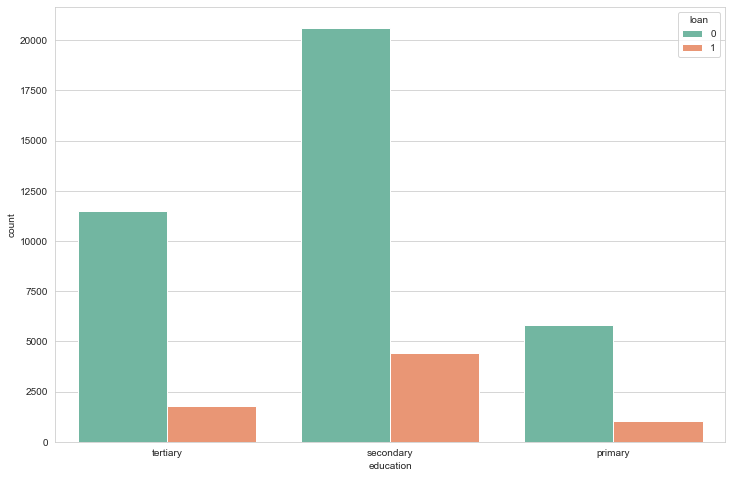

In [54]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='education', hue='loan',palette='Set2')

In [27]:
for value in en_df['education'].unique():
    x, y = en_df[en_df['education']==value]['loan'].value_counts()
    print(value)
    print('0 :', x)
    print('1 :', y)
    print("How many percent have personal loan:", round(y/(x+y),2))
    print('\n')

tertiary
0 : 11517
1 : 1784
How many percent have personal loan: 0.13


secondary
0 : 20623
1 : 4436
How many percent have personal loan: 0.18


primary
0 : 5827
1 : 1024
How many percent have personal loan: 0.15




Those with tertiary education have taken less loans.

<AxesSubplot:xlabel='day_of_week', ylabel='count'>

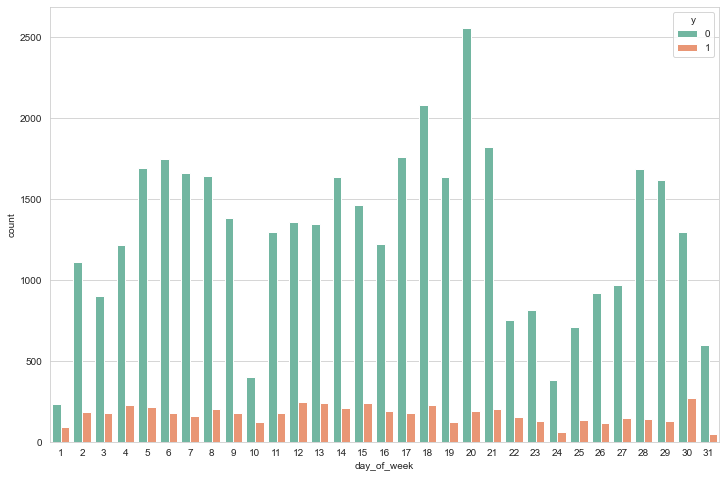

In [58]:
plt.figure(figsize=(12, 8))
sns.countplot(data=en_df, x='day_of_week', hue='y',palette='Set2')

In [28]:
#for value in en_df['day_of_week'].unique():
    #x, y = en_df[en_df['day_of_week']==value]['y'].value_counts()
    #print(value)
    #print('0 :', x)
    #print('1 :', y)
    #print("How many percent didn't accept:", round(x/(x+y),2))
    #print('\n')

5
0 : 1695
1 : 215
How many percent didn't accept: 0.89


6
0 : 1751
1 : 181
How many percent didn't accept: 0.91


7
0 : 1660
1 : 157
How many percent didn't accept: 0.91


8
0 : 1641
1 : 201
How many percent didn't accept: 0.89


9
0 : 1382
1 : 179
How many percent didn't accept: 0.89


12
0 : 1359
1 : 244
How many percent didn't accept: 0.85


13
0 : 1344
1 : 241
How many percent didn't accept: 0.85


14
0 : 1638
1 : 210
How many percent didn't accept: 0.89


15
0 : 1465
1 : 238
How many percent didn't accept: 0.86


16
0 : 1223
1 : 192
How many percent didn't accept: 0.86


19
0 : 1635
1 : 122
How many percent didn't accept: 0.93


20
0 : 2560
1 : 192
How many percent didn't accept: 0.93


21
0 : 1825
1 : 201
How many percent didn't accept: 0.9


23
0 : 813
1 : 126
How many percent didn't accept: 0.87


26
0 : 919
1 : 116
How many percent didn't accept: 0.89


27
0 : 971
1 : 150
How many percent didn't accept: 0.87


28
0 : 1687
1 : 143
How many percent didn't accept: 0.92


29
0 :

<AxesSubplot:xlabel='duration', ylabel='Count'>

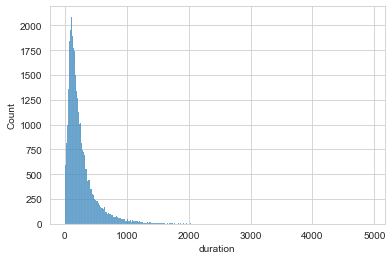

In [61]:
sns.histplot(data=en_df, x='duration')

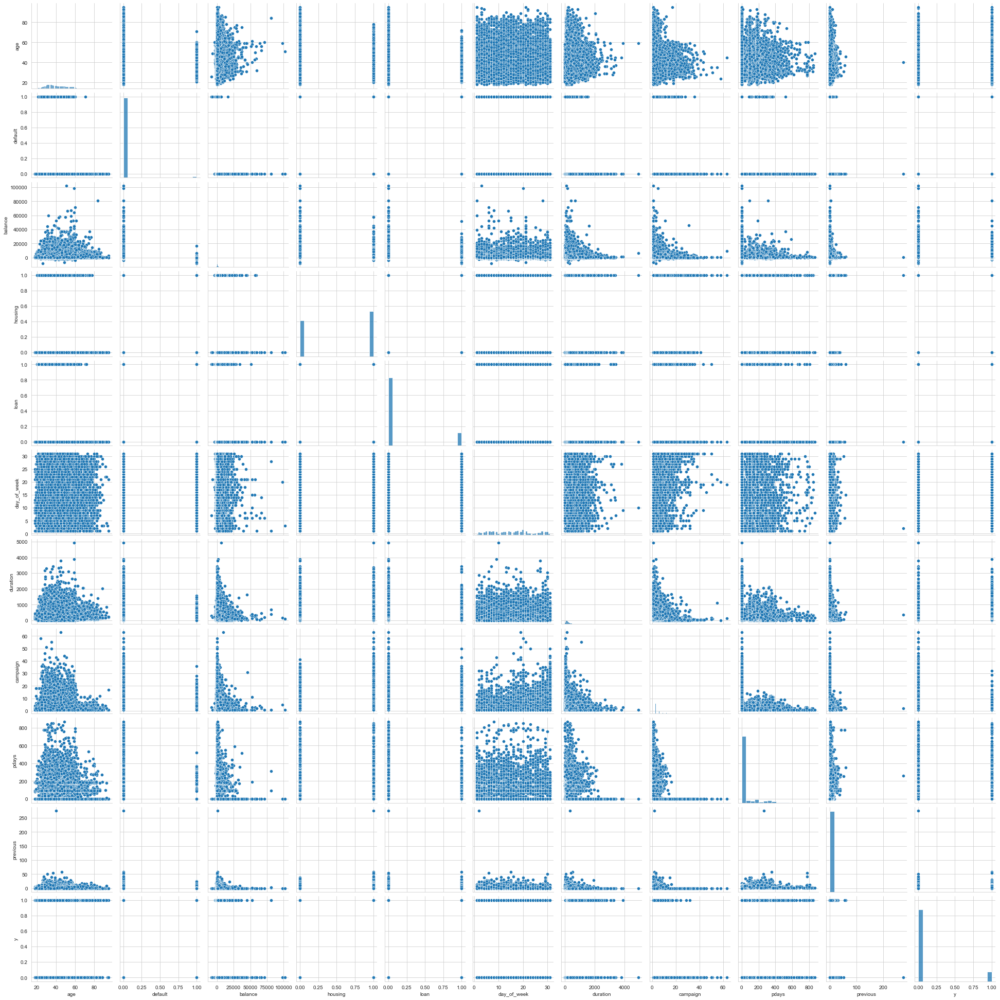

In [62]:
sns.pairplot(data=en_df)

According to pairplot above, there is no clear correlation between features.

In [9]:
en_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,0,2143,1,0,cellular,5,may,261,1,-1,0,0
1,44,technician,single,secondary,0,29,1,0,cellular,5,may,151,1,-1,0,0
2,33,entrepreneur,married,secondary,0,2,1,1,cellular,5,may,76,1,-1,0,0
3,47,blue-collar,married,secondary,0,1506,1,0,cellular,5,may,92,1,-1,0,0
4,33,blue-collar,single,secondary,0,1,0,0,cellular,5,may,198,1,-1,0,0


## 2.Get dummies

In [8]:
dummy_df = en_df.copy(deep= True)
# Contact column
dummy_df['contact']=pd.get_dummies(dummy_df['contact'],drop_first=True) #cellular-->0 , telephone-->1
dummy_df

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,0,2143,1,0,0,5,may,261,1,-1,0,0
1,44,technician,single,secondary,0,29,1,0,0,5,may,151,1,-1,0,0
2,33,entrepreneur,married,secondary,0,2,1,1,0,5,may,76,1,-1,0,0
3,47,blue-collar,married,secondary,0,1506,1,0,0,5,may,92,1,-1,0,0
4,33,blue-collar,single,secondary,0,1,0,0,0,5,may,198,1,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,825,0,0,0,17,nov,977,3,-1,0,1
45207,71,retired,divorced,primary,0,1729,0,0,0,17,nov,456,2,-1,0,1
45208,72,retired,married,secondary,0,5715,0,0,0,17,nov,1127,5,184,3,1
45209,57,blue-collar,married,secondary,0,668,0,0,1,17,nov,508,4,-1,0,0


In [10]:
#Marital column
encoded_marital=pd.get_dummies(dummy_df['marital'], prefix='marital')
dummy_df1 = pd.concat([dummy_df, encoded_marital], axis=1)
dummy_df1.drop('marital', axis=1, inplace=True)
dummy_df1.head()

,age,job,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y,marital_divorced,marital_married,marital_single
0,58,management,tertiary,0,2143,1,0,0,5,may,261,1,-1,0,0,0,1,0
1,44,technician,secondary,0,29,1,0,0,5,may,151,1,-1,0,0,0,0,1
2,33,entrepreneur,secondary,0,2,1,1,0,5,may,76,1,-1,0,0,0,1,0
3,47,blue-collar,secondary,0,1506,1,0,0,5,may,92,1,-1,0,0,0,1,0
4,33,blue-collar,secondary,0,1,0,0,0,5,may,198,1,-1,0,0,0,0,1


# Label encoding

In [11]:
label_df = dummy_df1.copy(deep=True)
le_encoder= LabelEncoder()

for i in label_df.select_dtypes('object').columns:
    label_df[i] = le_encoder.fit_transform(label_df[i])

In [14]:
label_df

,age,job,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y,marital_divorced,marital_married,marital_single
0,58,4,2,0,2143,1,0,0,5,8,261,1,-1,0,0,0,1,0
1,44,9,1,0,29,1,0,0,5,8,151,1,-1,0,0,0,0,1
2,33,2,1,0,2,1,1,0,5,8,76,1,-1,0,0,0,1,0
3,47,1,1,0,1506,1,0,0,5,8,92,1,-1,0,0,0,1,0
4,33,1,1,0,1,0,0,0,5,8,198,1,-1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,2,0,825,0,0,0,17,9,977,3,-1,0,1,0,1,0
45207,71,5,0,0,1729,0,0,0,17,9,456,2,-1,0,1,1,0,0
45208,72,5,1,0,5715,0,0,0,17,9,1127,5,184,3,1,0,1,0
45209,57,1,1,0,668,0,0,1,17,9,508,4,-1,0,0,0,1,0


## 1.4) What are hypothesis tests, and how can they aid us in EDA, and model building?

Hypothesis tests are statistical procedures used to make inferences about population parameters based on sample data. They help us evaluate the evidence against a specific hypothesis or claim about a population parameter. Hypothesis testing involves formulating null and alternative hypotheses, collecting and analyzing data, and drawing conclusions based on statistical evidence.

>Hypothesis tests can help validate assumptions about the data. For example, normality tests such as the Shapiro-Wilk test 
can assess the normality assumption.
>
>Hypothesis tests can compare sample statistics to population parameters or known values to identify discrepancies. For example, a one-sample t-test can test if the mean of a sample differs significantly from a hypothesized population mean.
>
>Hypothesis tests can identify relationships or differences between variables. For example, a chi-square test of independence can assess if there is a significant association between categorical variables.

## 1.5) Conduct hypothesis tests (complete with null and alternative hypotheses) for the following:
>### 1.5.1) Whether or not marital status has an effect on whether the client has a personal loan
>
>### 1.5.2) The effect of the previous marketing campaign on the client
>
>### 1.5.3) If the type of job has an effect on credit default.

In [16]:
impute_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,no,2143,yes,no,cellular,5,may,261,1,-1,0,no
1,44,technician,single,secondary,no,29,yes,no,cellular,5,may,151,1,-1,0,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,cellular,5,may,76,1,-1,0,no
3,47,blue-collar,married,secondary,no,1506,yes,no,cellular,5,may,92,1,-1,0,no
4,33,blue-collar,single,secondary,no,1,no,no,cellular,5,may,198,1,-1,0,no


### 1.5.1)
Chi-Squared Test:

Tests whether two categorical variables are related or independent.

#### Assumptions:

>Observations used in the calculation of the contingency table are independent.
>
>25 or more examples in each cell of the contingency table.

#### Interpretation:

>H0: the two samples are independent.
>
>H1: there is a dependency between the samples.

In [17]:
# Chi-Squared Test
from scipy.stats import chi2_contingency

table = pd.crosstab(df['marital'], df['loan'])
stat, p, dof, expected = chi2_contingency(table)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably independent')
else:
    print('Probably dependent')

stat=121.953, p=0.000
Probably dependent


So the type of marital depends on getting loan.

### 1.5.2)
Mann-Whitney U Test:

Distribution of two data samples are equal or not.

#### Assumption:
>a)Each data sample's observation are independent and distributed.
>
>b)Observations in each data samples can be ranked.

#### Hypothesis:
>H0: the distribution of two samples are equal .
>
>H1: the distribution of two samples are not equal.

Assumption Check:

>H₀: The data is normally distributed.
>
>H₁: The data is not normally distributed.

>H₀: The variances of the samples are the same.
>
>H₁: The variances of the samples are different.

In [22]:
from scipy.stats import shapiro

def check_normality(data):
    test_stat_normality, p_value_normality=shapiro(data)
    print("p value:%.4f" % p_value_normality)
    if p_value_normality <0.05:
        print("Reject null hypothesis >> The data is not normally distributed")
    else:
        print("Fail to reject null hypothesis >> The data is normally distributed")

In [36]:
no_deposit_previous=impute_df[impute_df['y']=='no']['previous']
yes_deposit_previous=impute_df[impute_df['y']=='yes']['previous']

In [39]:
check_normality(no_deposit_previous)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


In [40]:
check_normality(yes_deposit_previous)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


In [23]:
from scipy.stats import levene

def check_variance_homogeneity(group1, group2):
    test_stat_var, p_value_var= levene(group1,group2)
    print("p value:%.4f" % p_value_var)
    if p_value_var <0.05:
        print("Reject null hypothesis >> The variances of the samples are different.")
    else:
        print("Fail to reject null hypothesis >> The variances of the samples are same.")

In [43]:
check_variance_homogeneity(no_deposit_previous, yes_deposit_previous)

p value:0.0000
Reject null hypothesis >> The variances of the samples are different.


There are two groups, and data is collected from different individuals, so it is not paired. However, the normality assumption is not satisfied; therefore, we need to use the nonparametric unpaired data: the Mann-Whitney U Test.

In [44]:
from scipy.stats import mannwhitneyu
ttest,pvalue = mannwhitneyu(no_deposit_previous,yes_deposit_previous, alternative="two-sided")
print("p-value:%.4f" % pvalue)
if pvalue <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to recejt null hypothesis")

p-value:0.0000
Reject null hypothesis


there is difference between the previous marketing campagin no the client.


### 1.5.3)
Chi-Squared Test:

Tests whether two categorical variables are related or independent.

#### Assumptions:

>Observations used in the calculation of the contingency table are independent.
>
>25 or more examples in each cell of the contingency table.

#### Interpretation:

>H0: the two samples are independent.
>
>H1: there is a dependency between the samples.

In [53]:
# Chi-Squared Test
from scipy.stats import chi2_contingency

table = pd.crosstab(impute_df['job'], impute_df['default'])
stat, p, dof, expected = chi2_contingency(table)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably independent')
else:
    print('Probably dependent')

stat=57.373, p=0.000
Probably dependent


So the type of job depends on getting credit.

## 1.6)  Design 2 more hypothesis tests to further explore the dataset.

### 1.6.1)The effect of the duration on the client.

In [56]:
no_deposit_duration=impute_df[impute_df['y']=='no']['duration']
yes_deposit_duration=impute_df[impute_df['y']=='yes']['duration']

In [57]:
check_normality(no_deposit_duration)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [60]:
check_normality(yes_deposit_duration)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


In [61]:
check_variance_homogeneity(no_deposit_duration, yes_deposit_duration)

p value:0.0000
Reject null hypothesis >> The variances of the samples are different.


In [62]:
from scipy.stats import mannwhitneyu
ttest,pvalue = mannwhitneyu(no_deposit_duration,yes_deposit_duration, alternative="two-sided")
print("p-value:%.4f" % pvalue)
if pvalue <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to recejt null hypothesis")

p-value:0.0000
Reject null hypothesis


So there is difference between the duration on the client.We have shown this with a visualization above.

### 1.6.2)The effect of the balance on the housing.

In [63]:
no_housing_balance=impute_df[impute_df['housing']=='no']['balance']
yes_housing_balance=impute_df[impute_df['housing']=='yes']['balance']

In [64]:
check_normality(no_housing_balance)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


In [65]:
check_normality(yes_housing_balance)

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


In [66]:
check_variance_homogeneity(no_housing_balance, yes_housing_balance)

p value:0.0000
Reject null hypothesis >> The variances of the samples are different.


In [67]:
from scipy.stats import mannwhitneyu

ttest,pvalue = mannwhitneyu(no_housing_balance,yes_housing_balance, alternative="two-sided")
print("p-value:%.4f" % pvalue)
if pvalue <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to recejt null hypothesis")

p-value:0.0000
Reject null hypothesis


So there is difference between the balance on the housing.We have shown this with a visualization above.

## 1.7) What are t-tests, and what are the implications of test results? Conduct one sample t-test on the dataset and explain your results.


A t-test is a statistical test that is used to determine if there is a significant difference between the means of two groups or samples. It helps to assess whether the observed difference in means is statistically significant or if it likely occurred by chance.

One-sample t-test: This test is used to compare the mean of a single group against a known or hypothesized value. It is often employed to determine if a sample mean is significantly different from a population mean or a specified value of interest.

#### Is the age of people in this community 40?

In [26]:
sample_df = impute_df.sample(int(0.05*len(impute_df)))
print(len(sample_df))

2260


In [27]:
check_normality(sample_df['age'])

p value:0.0000
Reject null hypothesis >> The data is not normally distributed


if the sample size is large enough, the t-test can still be reasonably robust to departures from normality.

In [28]:
from scipy.stats import ttest_1samp

# Load the data
data = sample_df['age']

# Define the hypothesized value
hypothesized_value = 40

# Perform the One Sample T-Test
t_statistic, p_value = ttest_1samp(data, hypothesized_value)

# Interpret the results
if p_value < 0.05:
    print('Reject Null Hypothesis')
else:
    print('Fail to Reject Null Hypothesis')

Reject Null Hypothesis


Therefore, the average age of people is 40.

When the data does not meet the assumption of normality, alternative non-parametric tests might be more appropriate.

In [33]:
from scipy.stats import wilcoxon

# Extract the age column as a NumPy array
age_data = sample_df['age'].values

# Specify the hypothesized value
hypothesized_value = 40

# Perform the one-sample Wilcoxon signed-rank test
statistic, p_value = wilcoxon(age_data - hypothesized_value)

# Print the results
print("Hypothesized Value:", hypothesized_value)
print("Test Statistic:", statistic)
print("P-value:", p_value)

Hypothesized Value: 40
Test Statistic: 1097121.0
P-value: 0.0007820215390895681


This test also proves the correctness of our assumption.

## 1.8) What are chi-square tests, and what can they be used for? Conduct two tests on the dataset and explain your results

Chi-Squared Test:

Tests whether two categorical variables are related or independent.

#### Assumptions:

>Observations used in the calculation of the contingency table are independent.
>
>25 or more examples in each cell of the contingency table.

#### Interpretation:

>H0: the two samples are independent.
>
>H1: there is a dependency between the samples.

In [34]:
# Chi-Squared Test
from scipy.stats import chi2_contingency

table = pd.crosstab(df['marital'], df['housing'])
stat, p, dof, expected = chi2_contingency(table)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably independent')
else:
    print('Probably dependent')

stat=19.345, p=0.000
Probably dependent


So the type of marital depends on getting housing loan.

In [35]:
# Chi-Squared Test
from scipy.stats import chi2_contingency

table = pd.crosstab(df['education'], df['housing'])
stat, p, dof, expected = chi2_contingency(table)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably independent')
else:
    print('Probably dependent')

stat=542.727, p=0.000
Probably dependent


So the type of education depends on getting housing loan.